In [94]:
import numpy as np
import scanpy as sc
import sklearn.linear_model

# Reading in prior labeled datasets
transfer = sc.read_h5ad("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/processed/adata/mapped_pathology_data/concatenated_full_11APR2025-2.h5ad")
adata = sc.read_h5ad("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-single-cell-pipeline/data/processed/spatial_niche_iterations/5APR2025.h5ad")

adata.obs["lipid_droplet_area"] = transfer.obs["lipid_droplet_area"]
adata.obs["oil_red_o_area"] = transfer.obs["oil_red_o_area"]
adata.obs["oil_red_o_area"] = transfer.obs["plin2_area"]

adata.obs["lipid_droplet_count"] = transfer.obs["lipid_droplet_count"]
adata.obs["oil_red_o_count"] = transfer.obs["oil_red_o_count"]
adata.obs["plin2_count"] = transfer.obs["plin2_count"]

adata.obs["total_area"] = transfer.obs["plin2_area"] + transfer.obs["oil_red_o_area"]

del(transfer)

/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/.venv/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/.venv/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [98]:
# Adding log-scale sizing 
adata.obs["log_lipid_droplet_area"] = adata.obs["lipid_droplet_area"].apply(np.log1p)
adata.obs["log_oil_red_o_area"] = adata.obs["oil_red_o_area"].apply(np.log1p)
adata.obs["log_plin2_area"] = adata.obs["plin2_area"].apply(np.log1p)
adata.obs["total_area"] = adata.obs["total_area"].apply(np.log1p)

adata.obs["group"] = adata.obs["folder"].replace(adata.obs.drop_duplicates(["folder", "group"])[["folder", "group"]].set_index("folder")["group"].to_dict())
adata.obs["folder-group"] = adata.obs["folder"].astype(str) + " - " + adata.obs["group"].astype(str)

adata.obs["spatial_groups"] = adata.obs["spatial_niche"].replace({
    "0": "White Matter",
    "1": "Grey Matter",
    "2": "Grey Matter",
    "3": "White Matter",
    "4": "White-Matter",
    "5": "White Matter",
    "6": "White Matter",
    "7": "Vasculature",
    "8": "Grey Matter",
    "9": "White Matter",
})

adata.write_h5ad("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-single-cell-pipeline/data/processed/spatial_niche_iterations/11APR2025-2.h5ad")

/tmp/ipykernel_17510/511704207.py:7: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs["group"] = adata.obs["folder"].replace(adata.obs.drop_duplicates(["folder", "group"])[["folder", "group"]].set_index("folder")["group"].to_dict())


In [99]:
import matplotlib.pyplot as plt

def concordance_check(adata, ax = None, title = ""):
    if ax == None:
        f, ax = plt.subplots()

    adata.obs.sample(1_000, replace=True).plot.scatter(
        x="log_plin2_area",
        y="log_oil_red_o_area",
        c="log_lipid_droplet_area",
        ax = ax
    )
    ax.set_title(title)

def paired_concordance(adata, row_label: str = "cell_type", col_label: str = "folder"):
    f, ax = plt.subplots(
        nrows = adata.obs[row_label].nunique(),
        ncols = adata.obs[col_label].nunique(), 
        figsize=(adata.obs[col_label].nunique() * 4, adata.obs[row_label].nunique() * 3)
    )

    for i in range(adata.obs[col_label].nunique()):
        for j in range(adata.obs[row_label].nunique()):
            concordance_check(
                adata[adata.obs[col_label].eq(adata.obs[col_label].unique()[i]) & adata.obs[row_label].eq(adata.obs[row_label].unique()[j])], 
                ax = ax[j][i],
                title = adata.obs[col_label].unique()[i] + " - " + adata.obs[row_label].unique()[j]
            )


In [100]:
def percent_above_zero(x):
    return (x > 0).mean() * 100  # proportion * 100 = percentage

def mean_above_zero(x):
    return x[(x > 0)].mean()

def first_item(x):
    return x[0]

adata.obs.query("cell_type == 'Astrocyte'").groupby("folder-group").agg({
    "log_lipid_droplet_area": ["mean", percent_above_zero, mean_above_zero],
    "log_plin2_area": ["mean", percent_above_zero, mean_above_zero],
    "log_oil_red_o_area": ["mean", percent_above_zero, mean_above_zero],
    "total_area": ["mean", percent_above_zero, mean_above_zero],
    "lipid_droplet_count": ["mean", percent_above_zero, mean_above_zero],
    "plin2_count": ["mean", percent_above_zero, mean_above_zero],
    "oil_red_o_count": ["mean", percent_above_zero, mean_above_zero],
    "group": [first_item]
}).sort_values(by=("group", "first_item")).style.background_gradient(axis=0, cmap='bwr')

/tmp/ipykernel_17510/3786526938.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.query("cell_type == 'Astrocyte'").groupby("folder-group").agg({
/tmp/ipykernel_17510/3786526938.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


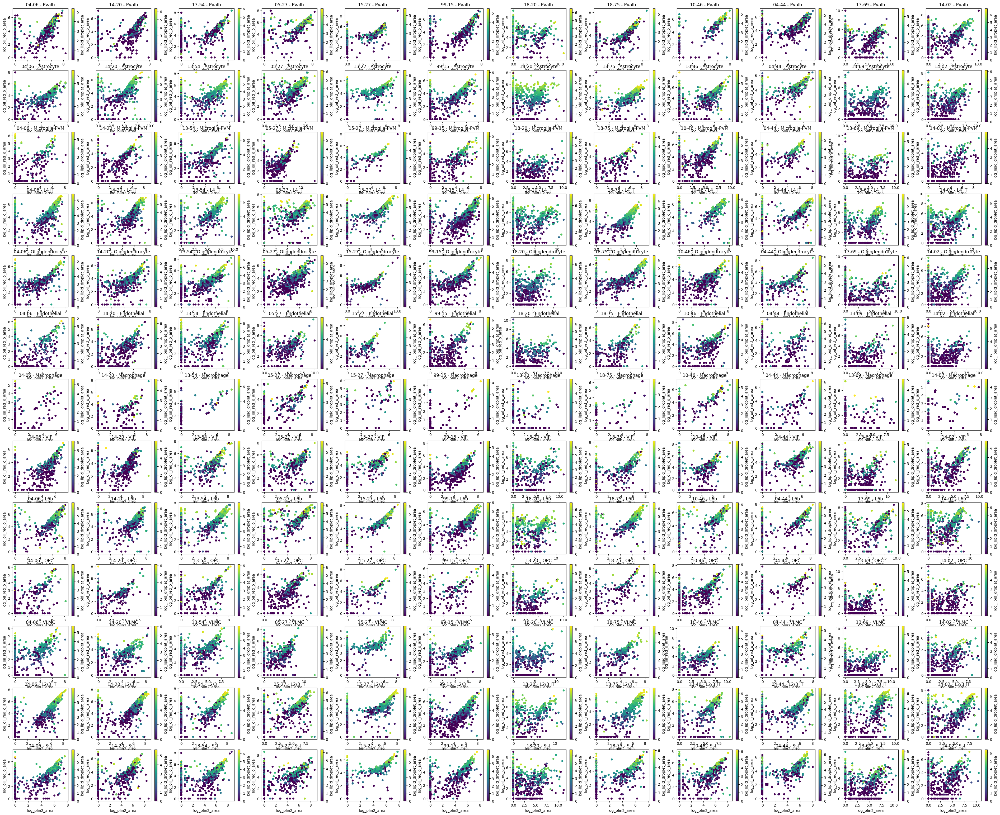

In [28]:
paired_concordance(adata)

In [101]:
def percent_above_zero(x):
    return (x > 0).mean() * 100  # proportion * 100 = percentage

def mean_above_zero(x):
    return x[(x > 0)].mean()

def first_item(x):
    return x[0]

specimens = {
    "18-20 - ND 33": "batch 1",
    "14-02 - ND 33": "batch 1",
    "10-46 - AD 33": "batch 1",
    "13-54 - AD 33": "batch 1",
    "13-69 - AD 44": "batch 1",
    "05-27 - AD 44": "batch 1",
    "14-20 - ND 33": "batch 2",
    "18-75 - ND 33": "batch 2",
    "15-27 - AD 33": "batch 2",
    "04-44 - AD 33": "batch 2",
    "04-06 - AD 44": "batch 2",
    "99-15 - AD 44": "batch 2",
}

adata.obs.query("cell_type == 'Astrocyte'").groupby("folder-group").agg({
    "log_lipid_droplet_area": ["mean", percent_above_zero, mean_above_zero],
    "log_plin2_area": ["mean", percent_above_zero, mean_above_zero],
    "log_oil_red_o_area": ["mean", percent_above_zero, mean_above_zero],
    "total_area": ["mean", percent_above_zero, mean_above_zero],
    "lipid_droplet_count": ["mean", percent_above_zero, mean_above_zero],
    "plin2_count": ["mean", percent_above_zero, mean_above_zero],
    "oil_red_o_count": ["mean", percent_above_zero, mean_above_zero],
    "group": [first_item],
}) \
.sort_values(by=("group", "first_item")) \
.loc[list(specimens.keys())] \
.style.background_gradient(axis=0, cmap='bwr')


/tmp/ipykernel_17510/3012000548.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.query("cell_type == 'Astrocyte'").groupby("folder-group").agg({
/tmp/ipykernel_17510/3012000548.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Text(0.5, 1.0, '04-44: Microglia-PVM')

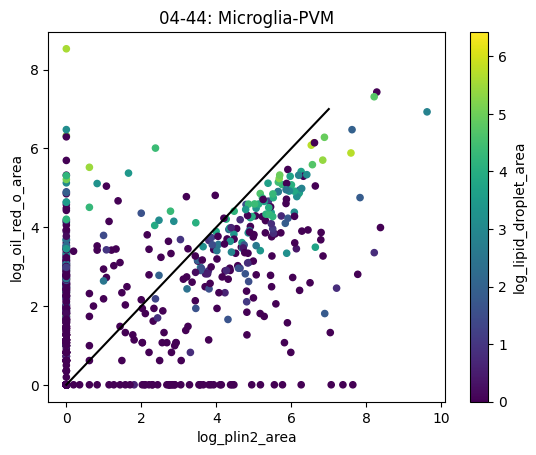

In [102]:
concordance_check(
    adata[
        adata.obs["cell_type"].eq("Microglia-PVM")
    ]
)
plt.plot([0, 7], [0, 7], c="k")
plt.title("04-44: Microglia-PVM")

/tmp/ipykernel_17510/2206345431.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(index=["folder", "group"], columns="cell_type", values="log_lipid_droplet_area", aggfunc=lambda x: np.mean([y>0 for y in x])) \
/tmp/ipykernel_17510/2206345431.py:25: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df.replace(specimens).query("folder == 'batch 1'"),
/tmp/ipykernel_17510/2206345431.py:34: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories,

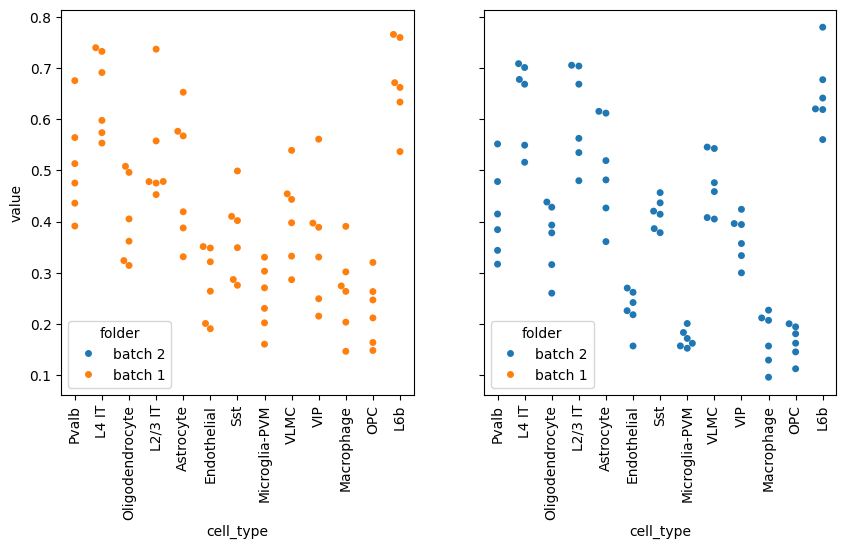

In [103]:
import seaborn as sns

specimens = {
    "18-20": "batch 1",
    "14-02": "batch 1",
    "10-46": "batch 1",
    "13-54": "batch 1",
    "13-69": "batch 1",
    "05-27": "batch 1",
    "14-20": "batch 2",
    "18-75": "batch 2",
    "15-27": "batch 2",
    "04-44": "batch 2",
    "04-06": "batch 2",
    "99-15": "batch 2",
}

df = adata.obs \
    .pivot_table(index=["folder", "group"], columns="cell_type", values="log_lipid_droplet_area", aggfunc=lambda x: np.mean([y>0 for y in x])) \
    .reset_index() \
    .melt(id_vars=["folder", "group"])

f, ax = plt.subplots(ncols=2, figsize=(10, 5), sharey=True)
sns.swarmplot(
    df.replace(specimens).query("folder == 'batch 1'"),
    x="cell_type",
    y="value",
    hue='folder',
    ax=ax[0]
)
ax[0].tick_params(axis='x', rotation=90)

sns.swarmplot(
    df.replace(specimens).query("folder == 'batch 2'"),
    x="cell_type",
    y="value",
    hue='folder',
    ax=ax[1]
)
ax[1].tick_params(axis='x', rotation=90)

/tmp/ipykernel_17510/1046857750.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df.replace(specimens),


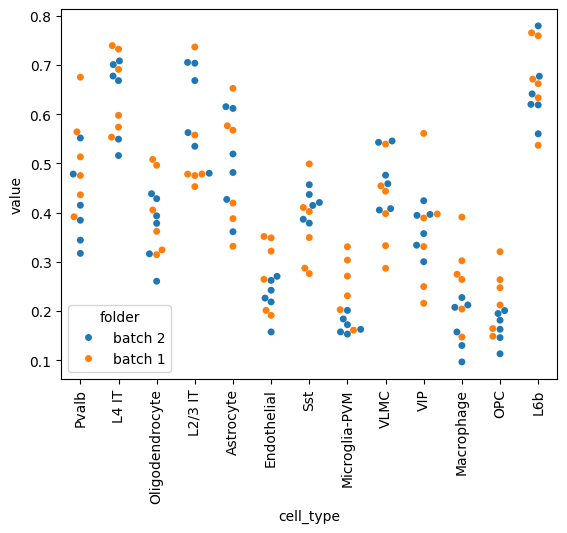

In [104]:
ax = sns.swarmplot(
    df.replace(specimens),
    x="cell_type",
    y="value",
    hue='folder',
)
ax.tick_params(axis='x', rotation=90)

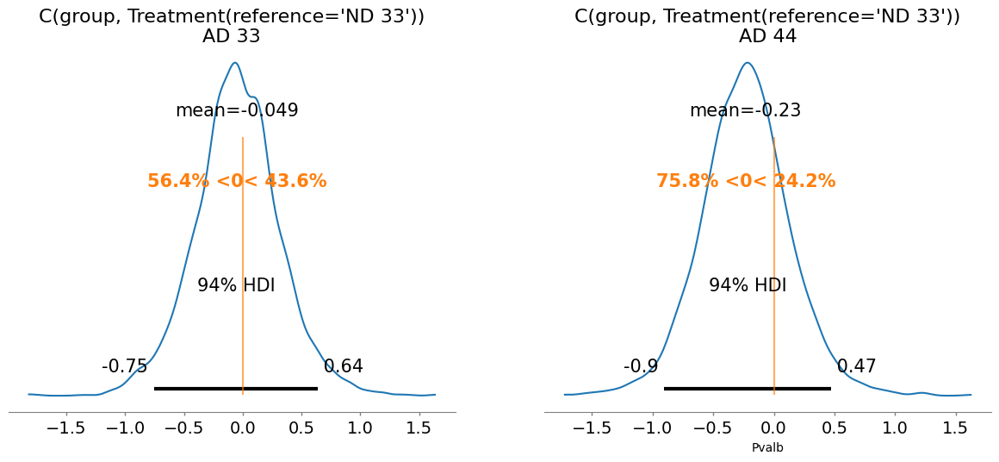

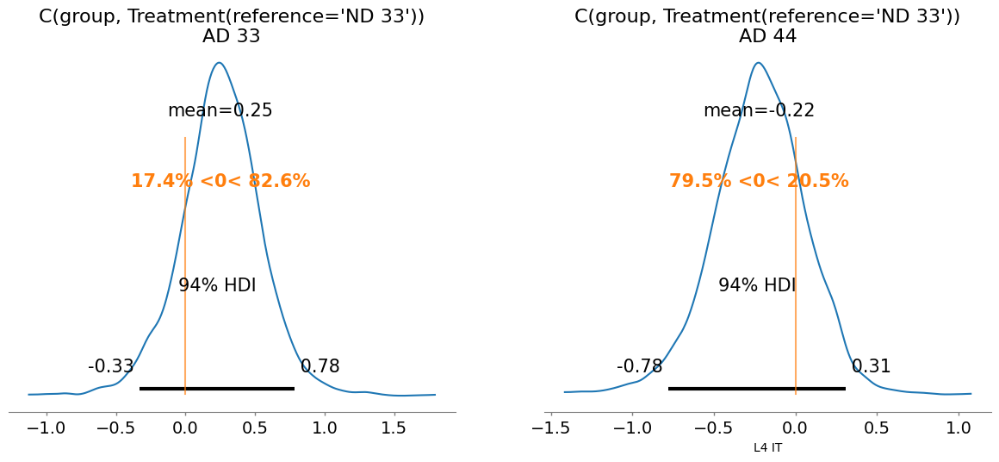

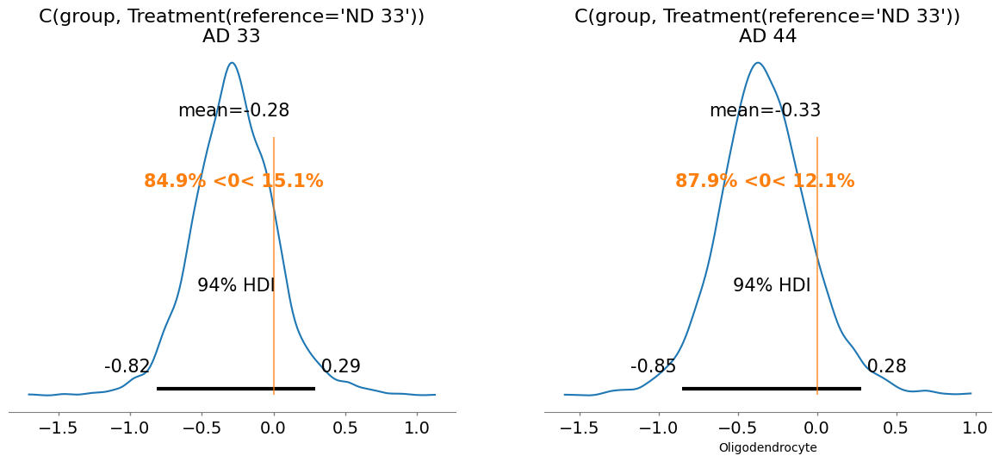

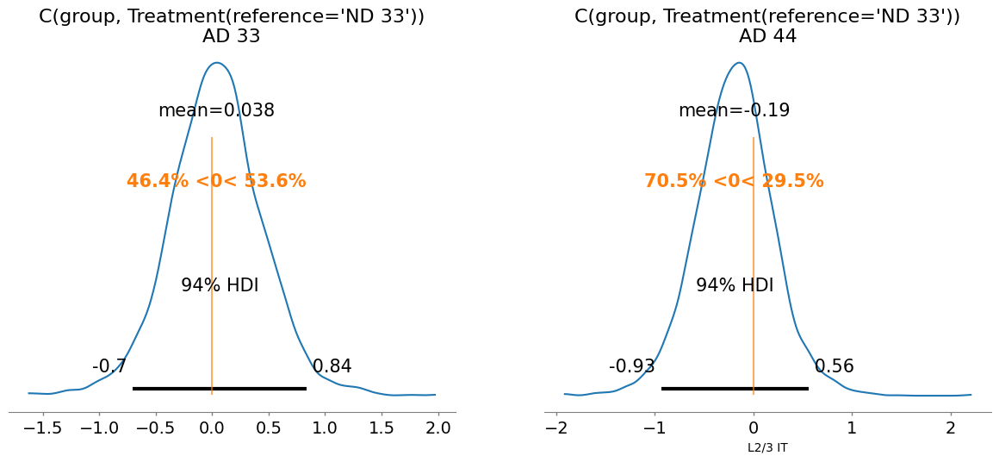

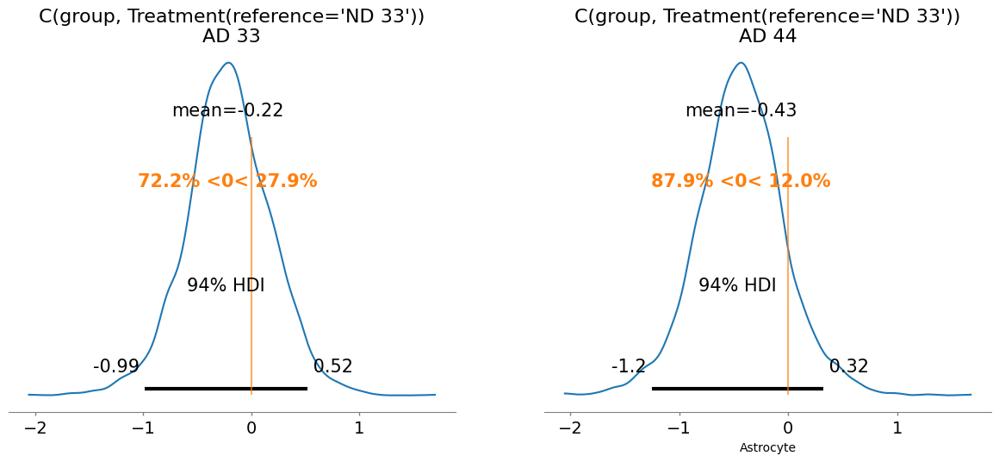

...

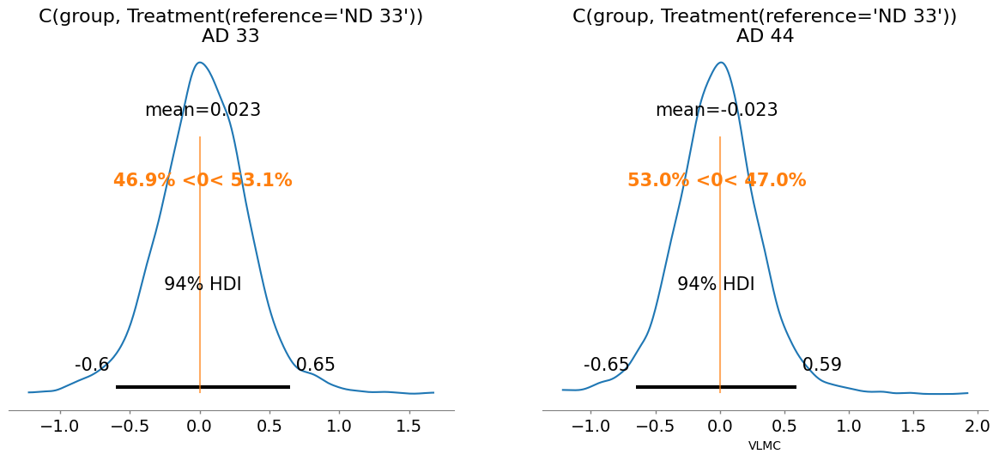

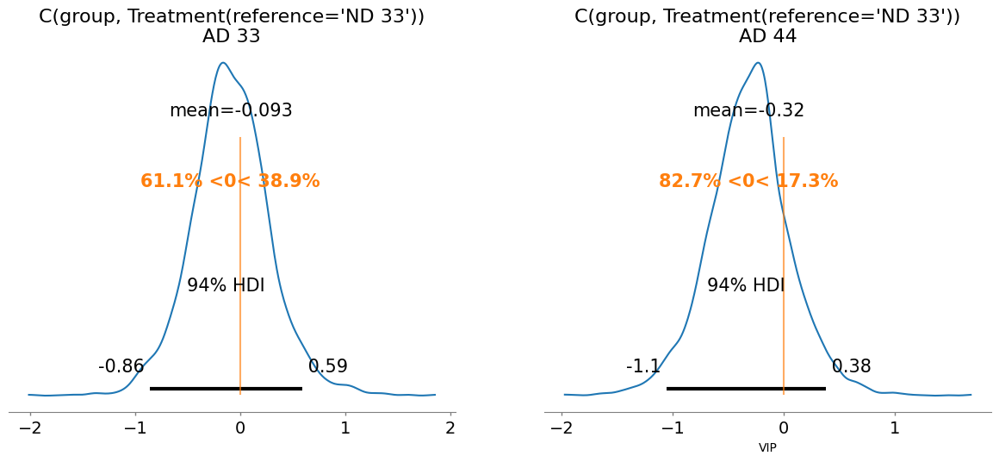

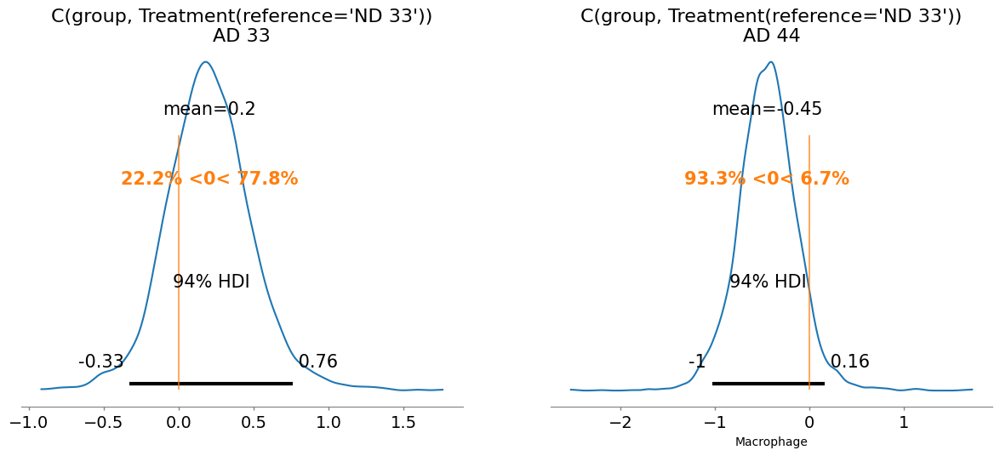

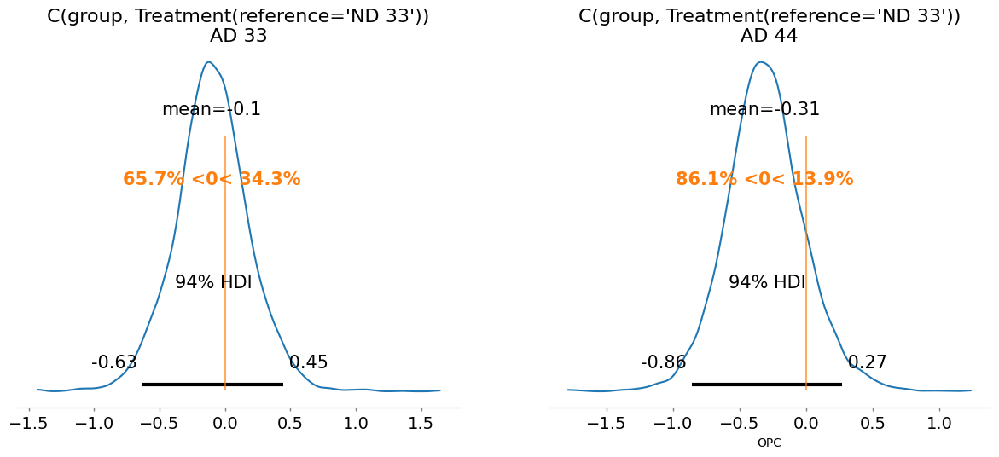

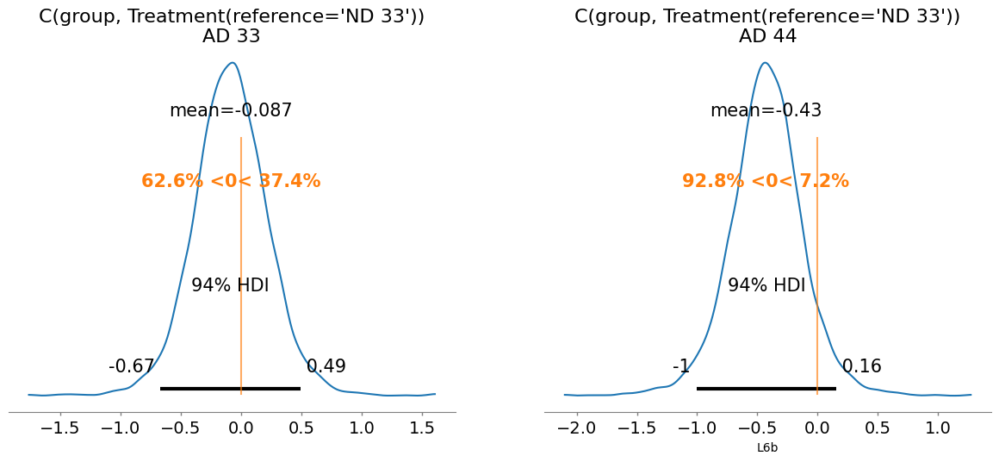

In [105]:
import bambi 
import arviz
from IPython.display import clear_output

fitted = {}
for cell_type in df["cell_type"].unique():
    model = bambi.Model("value ~ C(group, Treatment(reference='ND 33')) + folder", df.query("cell_type == @cell_type").replace(specimens), family="beta")
    fitted[cell_type] = model.fit()
    clear_output()

for cell_type in fitted:
    arviz.plot_posterior(fitted[cell_type], ref_val=0, var_names=["C(group, Treatment(reference='ND 33'))"])
    plt.xlabel(cell_type)

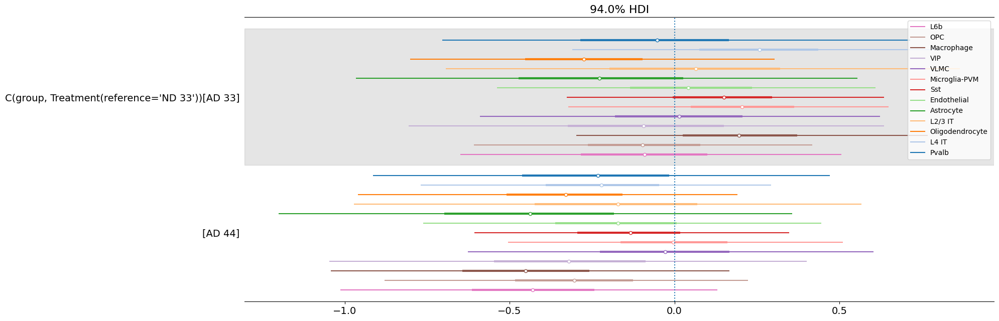

In [53]:
import arviz as az
import matplotlib.pyplot as plt

# Suppose this is your dict of InferenceData objects
idata_dict = fitted

# Unpack into lists
model_names = list(idata_dict.keys())
idata_list = list(idata_dict.values())

cmap = plt.get_cmap("tab20")
colors = [cmap(i) for i in range(len(idata_list))]

# Create forest plot
ax = az.plot_forest(
    idata_list,
    model_names=model_names,
    combined=True,  # separate subplots per model
    figsize=(20, len(model_names) * .5),  # Adjust height per model
    var_names=["C(group, Treatment(reference='ND 33'))"],
    colors=colors
)

ax[0].axvline(0, linestyle=":")
plt.tight_layout()
plt.show()


/tmp/ipykernel_17510/892697338.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(index=["folder", "group"], columns="cell_type", values="log_lipid_droplet_area", aggfunc="mean") \
/tmp/ipykernel_17510/892697338.py:25: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df.replace(specimens).query("folder == 'batch 1'"),
/tmp/ipykernel_17510/892697338.py:34: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories i

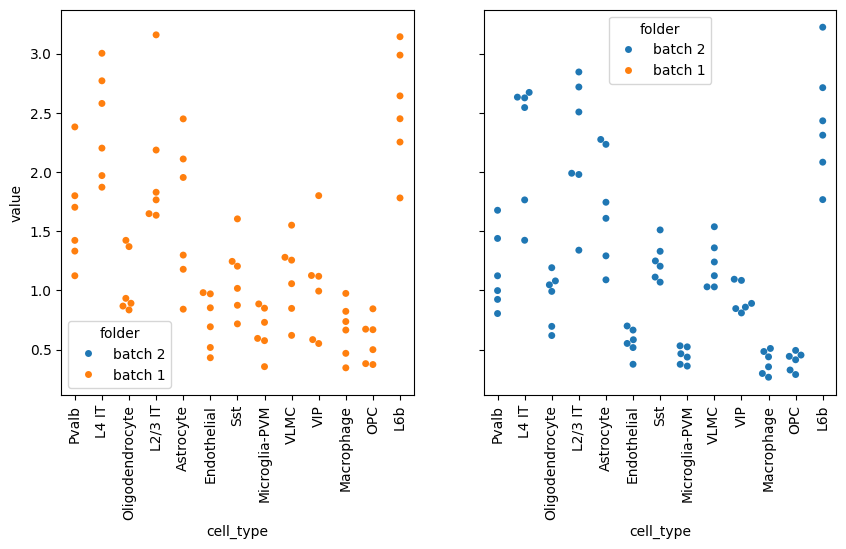

In [54]:
import seaborn as sns

specimens = {
    "18-20": "batch 1",
    "14-02": "batch 1",
    "10-46": "batch 1",
    "13-54": "batch 1",
    "13-69": "batch 1",
    "05-27": "batch 1",
    "14-20": "batch 2",
    "18-75": "batch 2",
    "15-27": "batch 2",
    "04-44": "batch 2",
    "04-06": "batch 2",
    "99-15": "batch 2",
}

df = adata.obs \
    .pivot_table(index=["folder", "group"], columns="cell_type", values="log_lipid_droplet_area", aggfunc="mean") \
    .reset_index() \
    .melt(id_vars=["folder", "group"])

f, ax = plt.subplots(ncols=2, figsize=(10, 5), sharey=True)
sns.swarmplot(
    df.replace(specimens).query("folder == 'batch 1'"),
    x="cell_type",
    y="value",
    hue='folder',
    ax=ax[0]
)
ax[0].tick_params(axis='x', rotation=90)

sns.swarmplot(
    df.replace(specimens).query("folder == 'batch 2'"),
    x="cell_type",
    y="value",
    hue='folder',
    ax=ax[1]
)
ax[1].tick_params(axis='x', rotation=90)

/tmp/ipykernel_17510/2693572959.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df.replace(specimens),


<Axes: xlabel='cell_type', ylabel='value'>

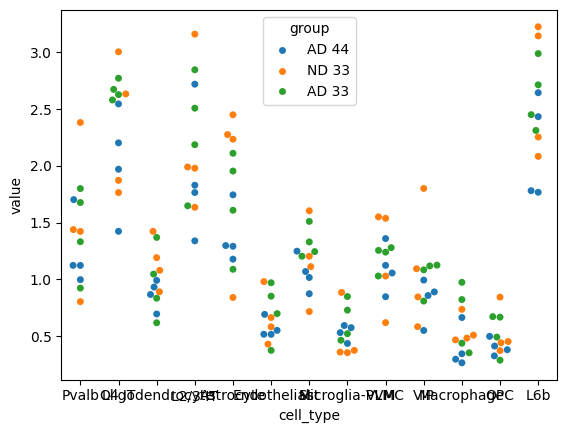

In [57]:
sns.swarmplot(
    df.replace(specimens),
    x="cell_type",
    y="value",
    hue='group',
)

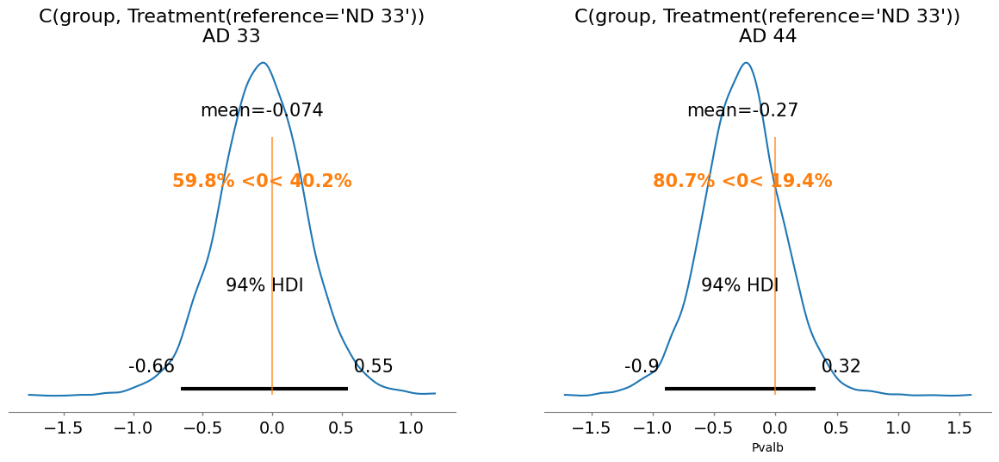

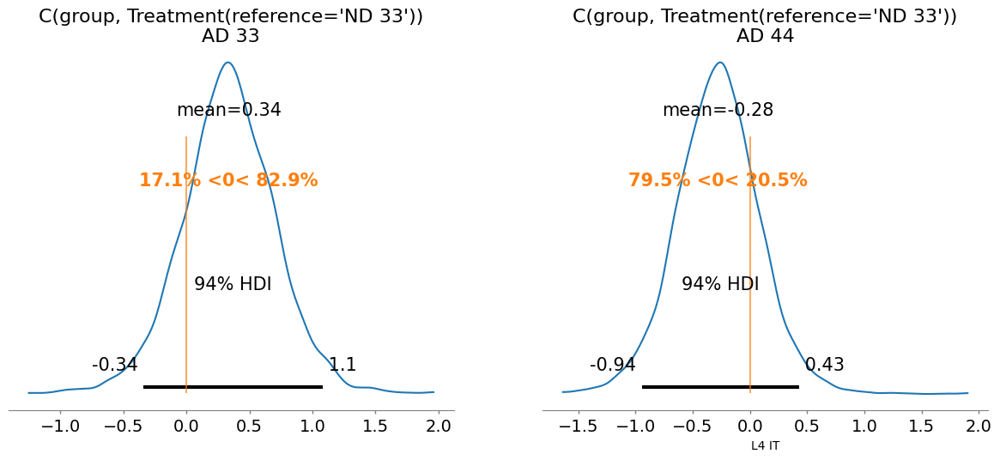

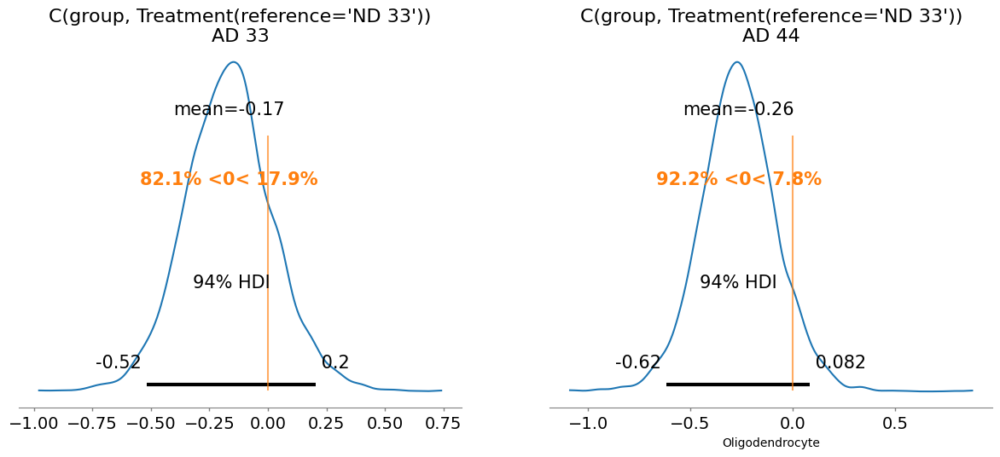

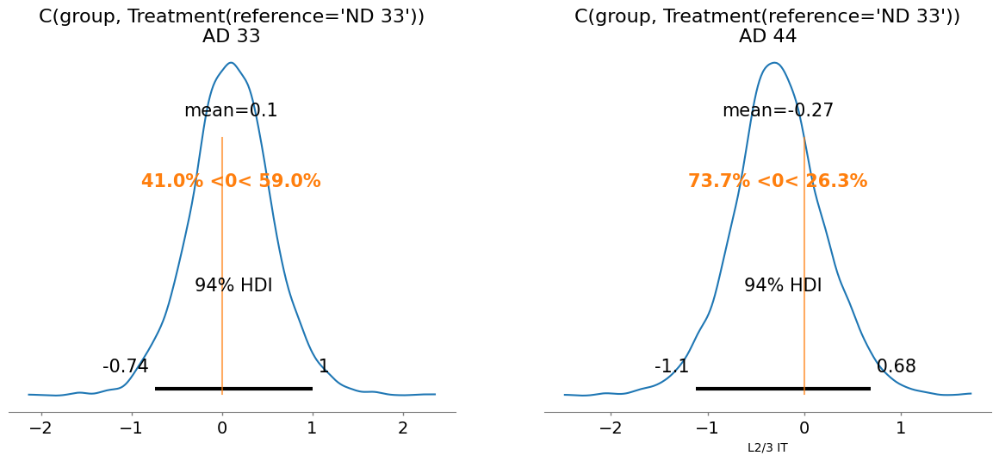

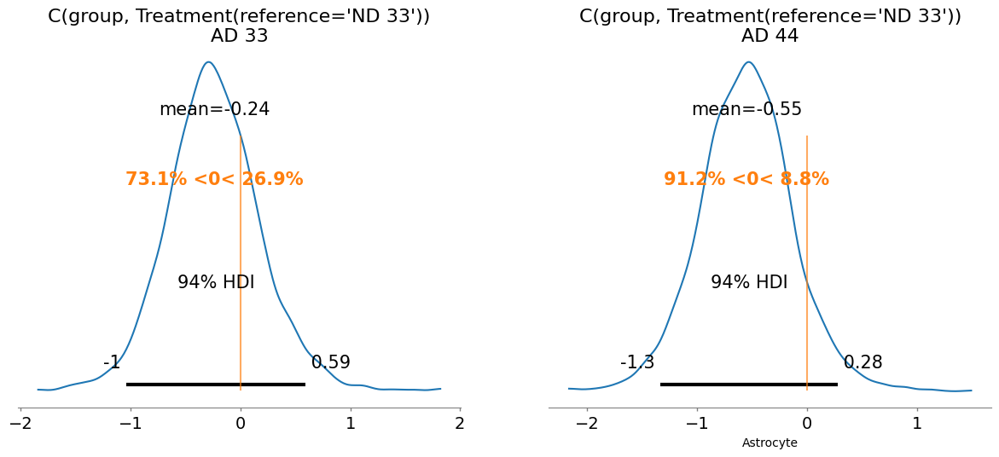

...

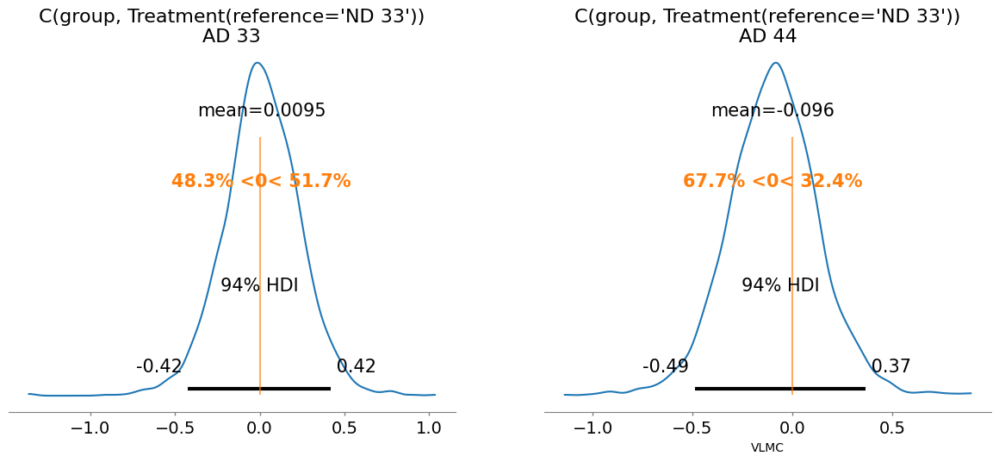

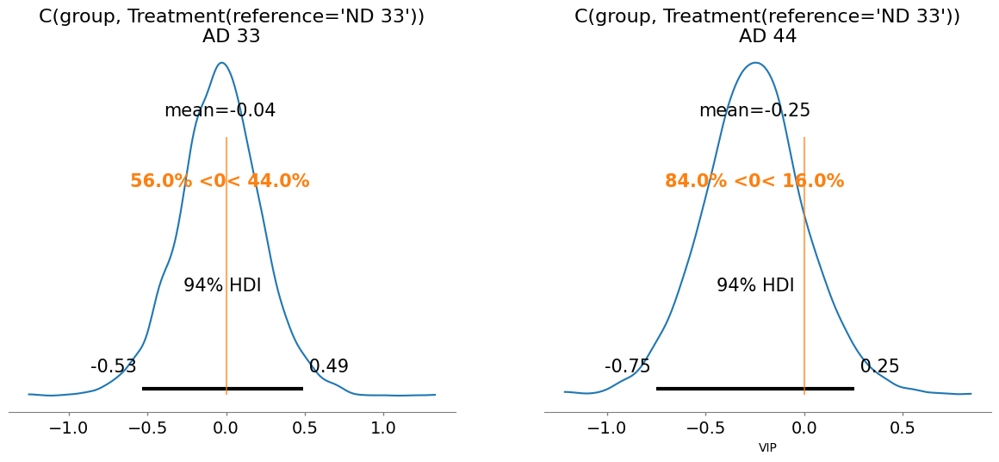

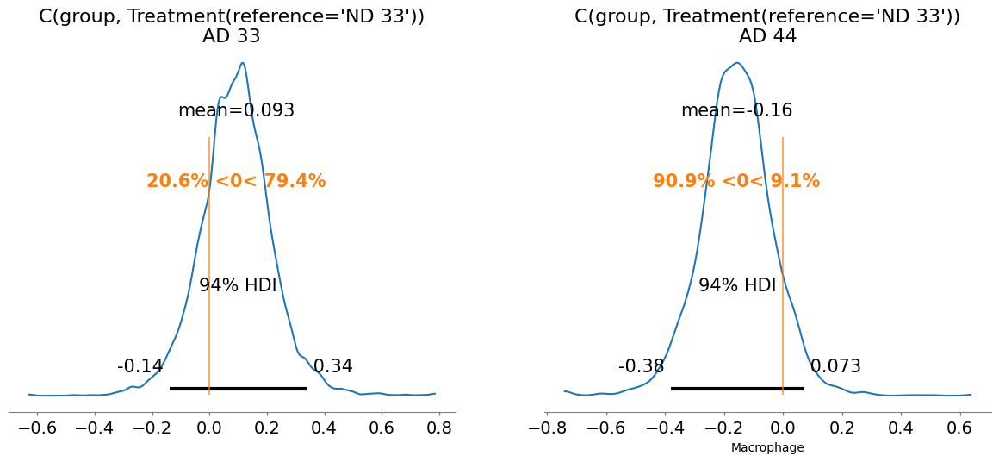

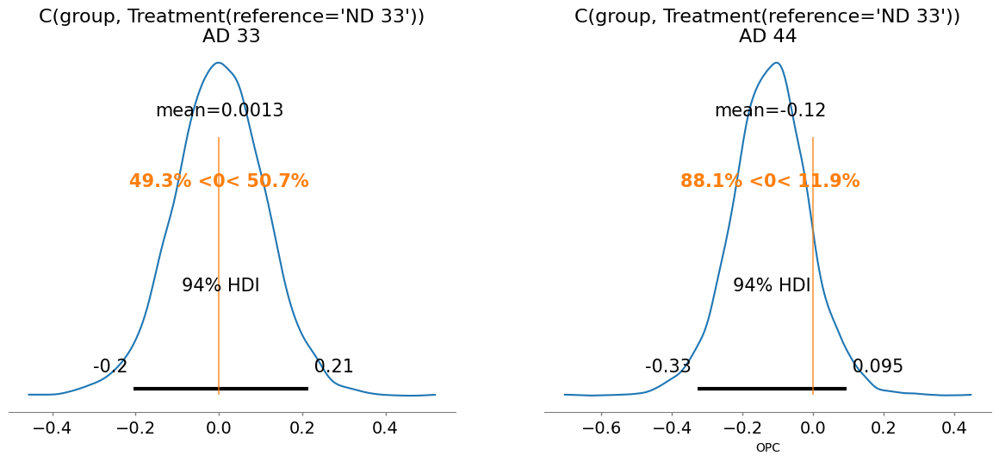

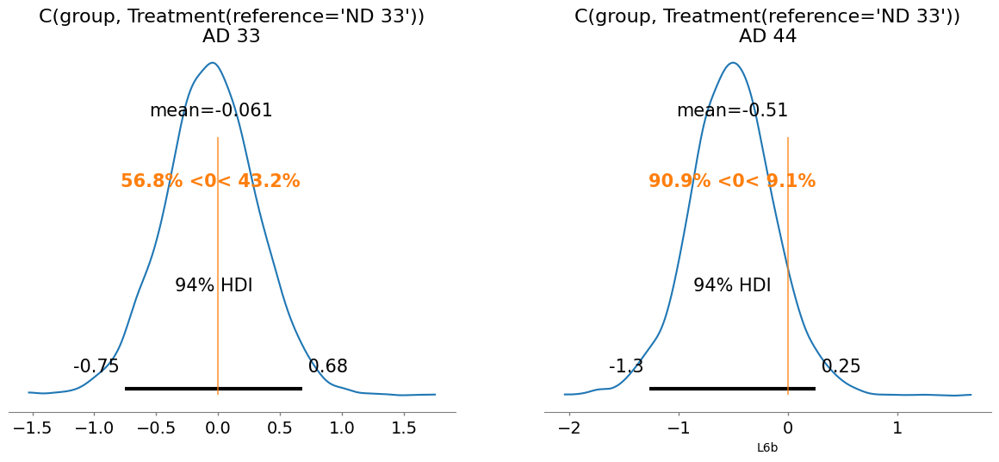

In [58]:
import bambi 
import arviz
from IPython.display import clear_output

fitted = {}
for cell_type in df["cell_type"].unique():
    model = bambi.Model("value ~ C(group, Treatment(reference='ND 33')) + folder", df.query("cell_type == @cell_type").replace(specimens), family="gaussian")
    fitted[cell_type] = model.fit()
    clear_output()

for cell_type in fitted:
    arviz.plot_posterior(fitted[cell_type], ref_val=0, var_names=["C(group, Treatment(reference='ND 33'))"])
    plt.xlabel(cell_type)


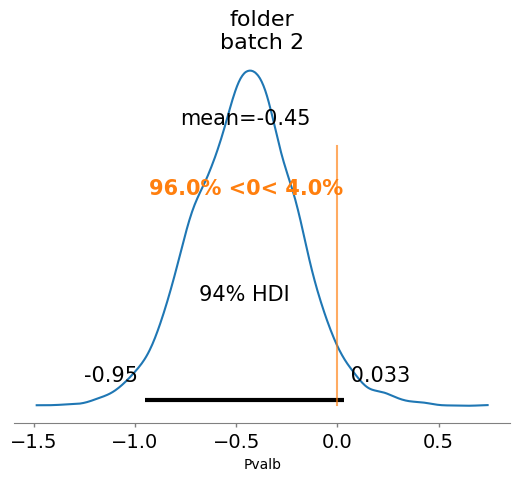

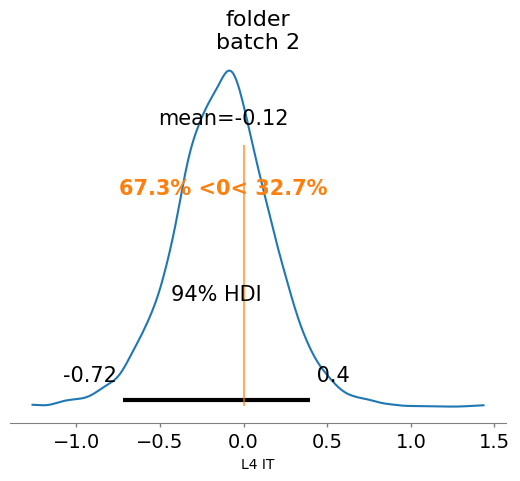

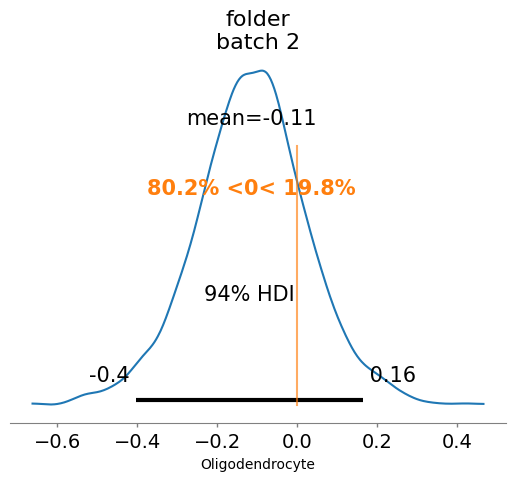

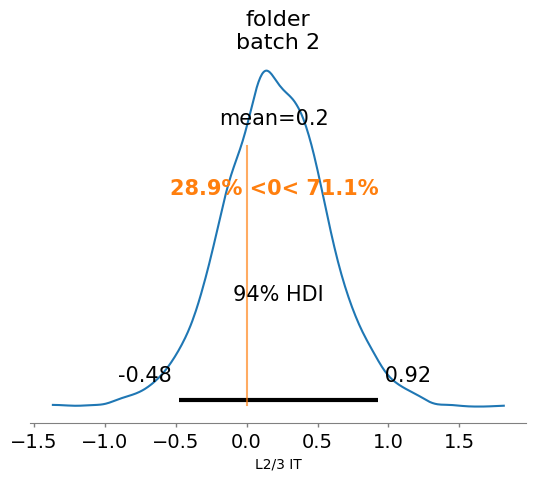

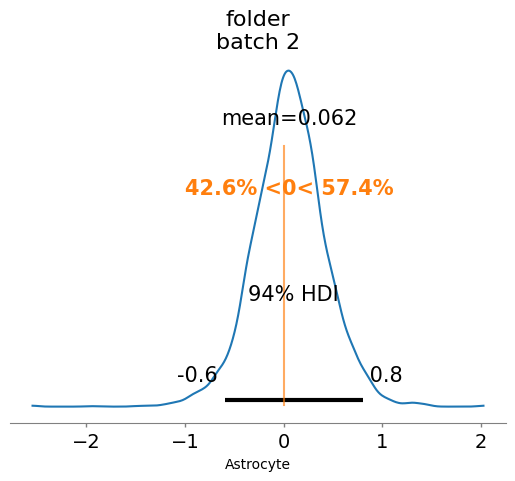

...

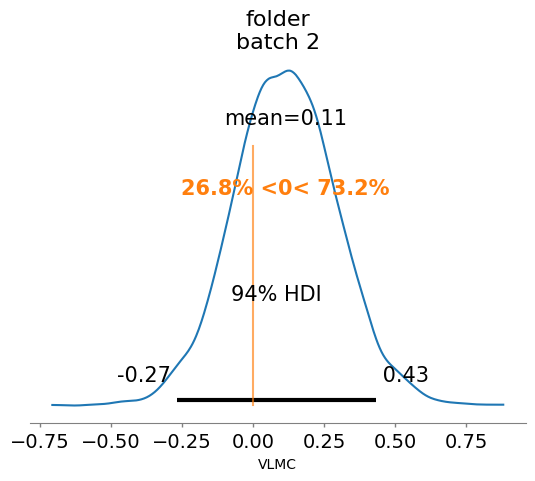

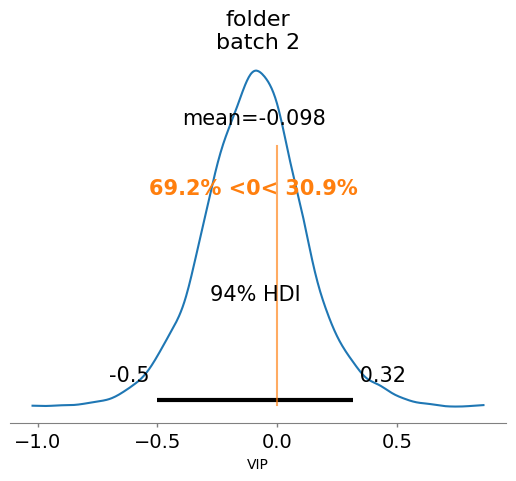

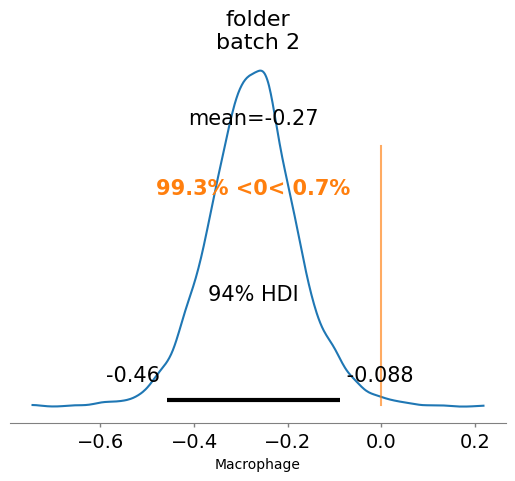

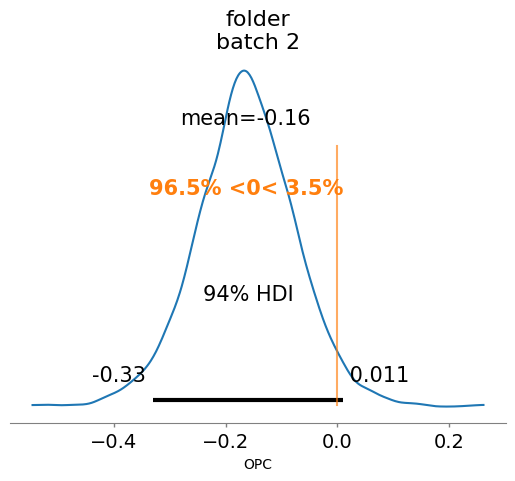

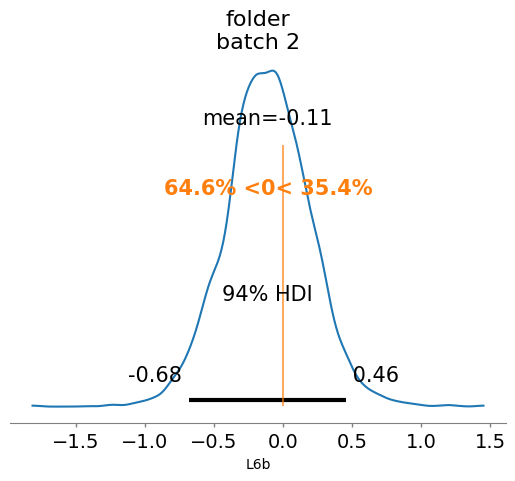

In [59]:
for cell_type in fitted:
    arviz.plot_posterior(fitted[cell_type], ref_val=0, var_names=["folder"])
    plt.xlabel(cell_type)

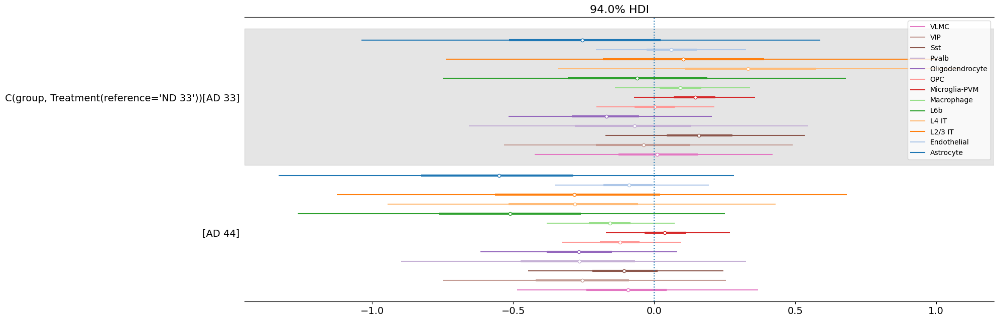

In [60]:
import arviz as az
import matplotlib.pyplot as plt

cmap = plt.get_cmap("tab20")
colors = [cmap(i) for i in range(len(idata_list))]


# Suppose this is your dict of InferenceData objects
idata_dict = dict(sorted(fitted.items()))

# Unpack into lists
model_names = list(idata_dict.keys())
idata_list = list(idata_dict.values())

# Create forest plot
ax = az.plot_forest(
    idata_list,
    model_names=model_names,
    combined=True,  # separate subplots per model
    figsize=(20, len(model_names) * .5),  # Adjust height per model
    var_names=["C(group, Treatment(reference='ND 33'))"],
    colors=colors,
)
ax[0].axvline(0, linestyle=":")
plt.tight_layout()
plt.show()


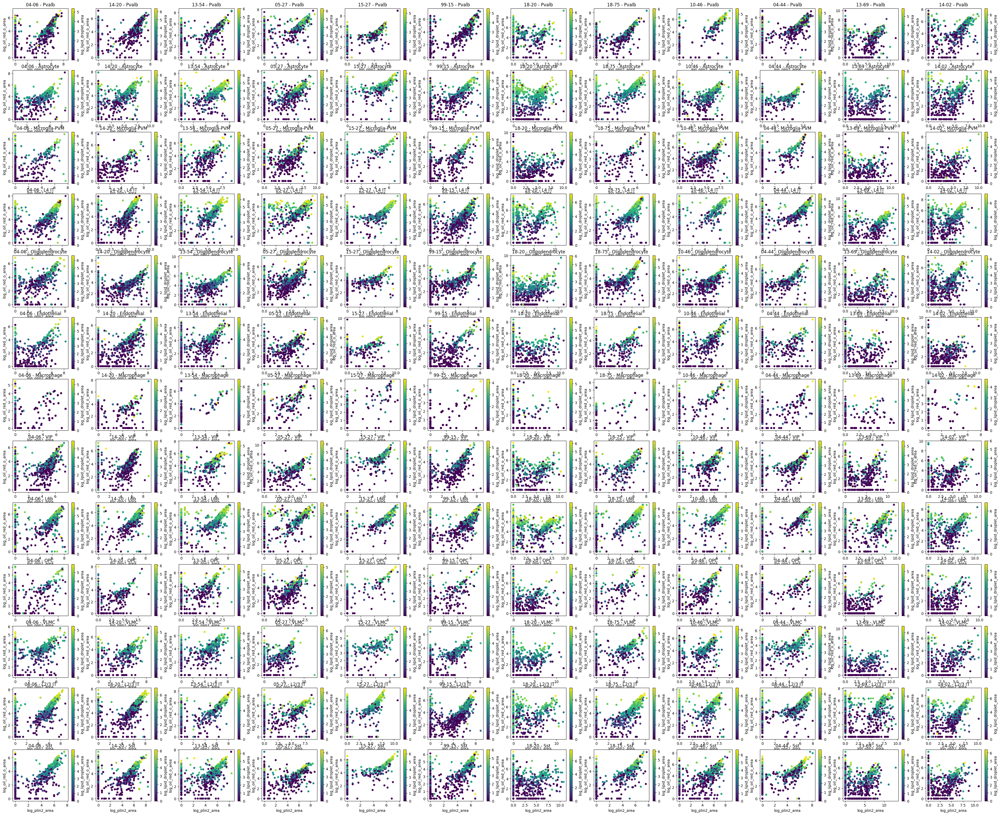

In [61]:
paired_concordance(adata)

In [67]:
import statsmodels.formula.api as smf
smf.ols("lipid_droplet_area ~ plin2_area + oil_red_o_area", adata.obs[["lipid_droplet_area", "plin2_area", "oil_red_o_area"]]).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     lipid_droplet_area   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1619.
Date:                Fri, 11 Apr 2025   Prob (F-statistic):               0.00
Time:                        10:03:15   Log-Likelihood:            -3.4056e+06
No. Observations:              598013   AIC:                         6.811e+06
Df Residuals:                  598011   BIC:                         6.811e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     22.9117      0.093    245.803      0.000      22.729      23.094
plin2_area     0.0011    2.7e-05     40.235      0.000       0.001       0.001
==============================================================================
Omnibus:                   818877.143   Durbin-Watson:                   1.872
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        600478181.826
Skew:                           7.547   Prob(JB):                         0.00
Kurtosis:                     157.503   Cond. No.                     3.46e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.46e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

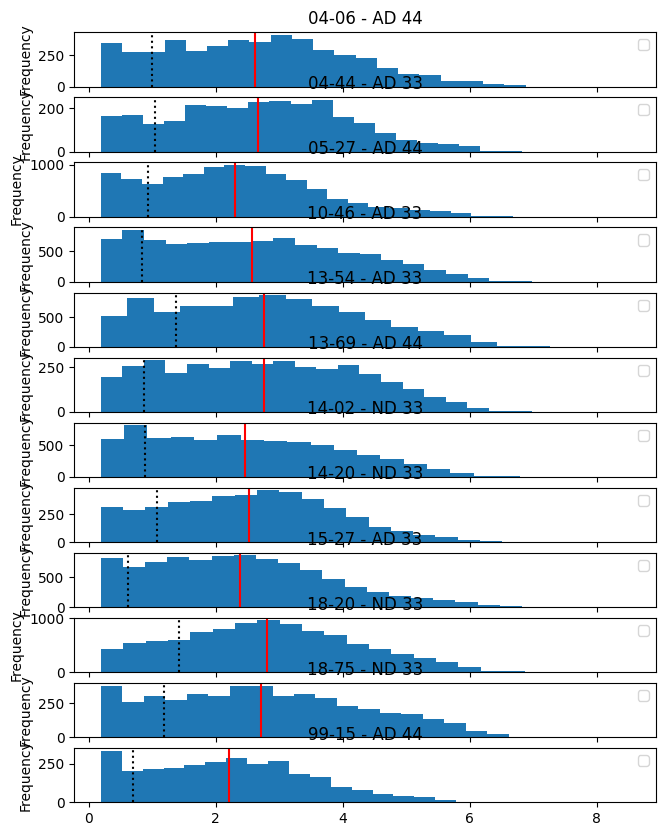

In [68]:
cell_type = "Oligodendrocyte"

ax = adata.obs.query("cell_type == @cell_type and log_lipid_droplet_area > 0") \
    .sort_values(by="group") \
    .plot.hist(column="log_lipid_droplet_area", by="folder-group", legend=True, subplots=True, sharex=True, sharey=False, bins=20, figsize=(7.5, 10))

for i in range(len(ax)):
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and `folder-group` == '{ax[i].title._text}'")["log_lipid_droplet_area"].mean(), c="k", linestyle=":")
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and log_lipid_droplet_area > 0 and `folder-group` == '{ax[i].title._text}'")["log_lipid_droplet_area"].mean(), c="r", linestyle="-")
    ax[i].legend([])

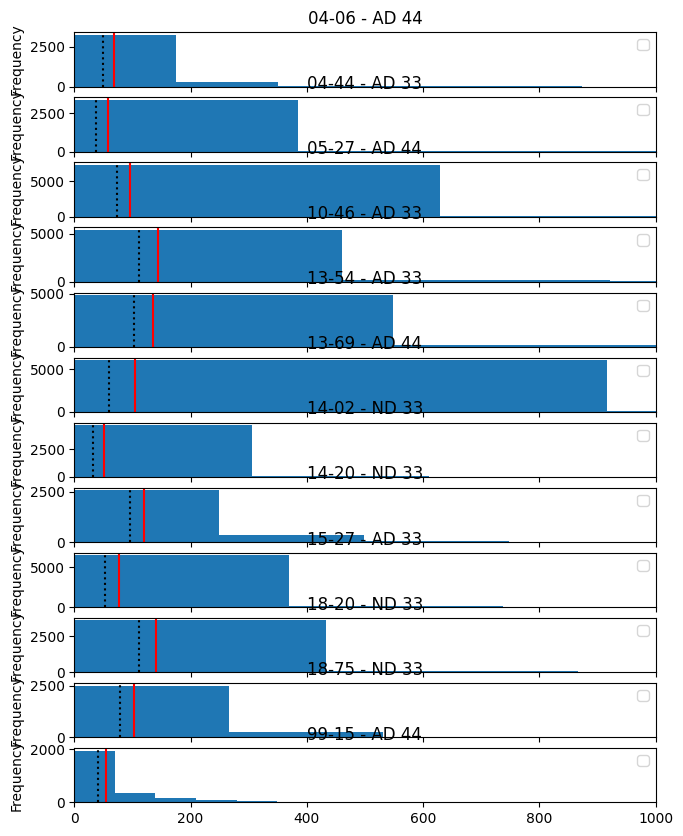

In [69]:
cell_type = "Astrocyte"

ax = adata.obs.query("cell_type == @cell_type and oil_red_o_area > 0") \
    .sort_values(by="group") \
    .plot.hist(column="oil_red_o_area", by="folder-group", legend=True, subplots=True, sharex=True, sharey=False, bins=20, figsize=(7.5, 10), xlim=(0, 1000))

for i in range(len(ax)):
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and `folder-group` == '{ax[i].title._text}'")["oil_red_o_area"].mean(), c="k", linestyle=":")
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and oil_red_o_area > 0 and `folder-group` == '{ax[i].title._text}'")["oil_red_o_area"].mean(), c="r", linestyle="-")
    ax[i].legend([])

/tmp/ipykernel_17510/1367017700.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .plot.hist(column="log_lipid_droplet_area", by="group", legend=True, subplots=True, sharex=True, sharey=False, bins=20, figsize=(7.5, 10))
/tmp/ipykernel_17510/1367017700.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .plot.hist(column="log_lipid_droplet_area", by="group", legend=True, subplots=True, sharex=True, sharey=False, bins=20, figsize=(7.5, 10))
/tmp/ipykernel_17510/1367017700.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=

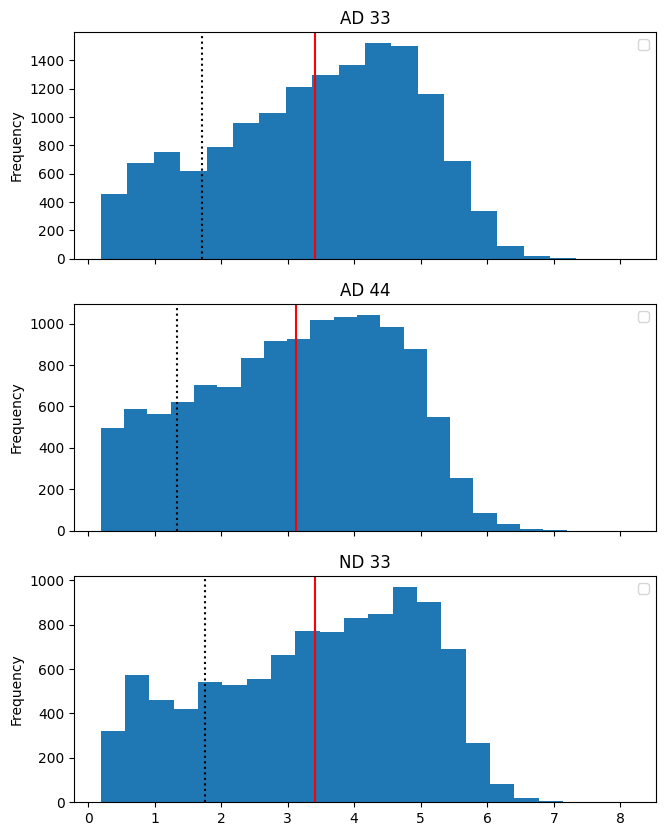

In [70]:
ax = adata.obs.query("cell_type == @cell_type and log_lipid_droplet_area > 0") \
    .sort_values(by="group") \
    .plot.hist(column="log_lipid_droplet_area", by="group", legend=True, subplots=True, sharex=True, sharey=False, bins=20, figsize=(7.5, 10))

for i in range(len(ax)):
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and `group` == '{ax[i].title._text}'")["log_lipid_droplet_area"].mean(), c="k", linestyle=":")
    ax[i].axvline(adata.obs.query(f"cell_type == @cell_type and log_lipid_droplet_area > 0 and `group` == '{ax[i].title._text}'")["log_lipid_droplet_area"].mean(), c="r", linestyle="-")
    ax[i].legend([])

In [72]:
import pandas as pd
import seaborn as sns

def first_item(x):
    return x[0]

def generate_summary_table(adata, cell_type: str = "Microglia-PVM"):
    if cell_type == None:
        table = adata.obs.groupby("folder-group").agg({
            "log_lipid_droplet_area": ["mean", percent_above_zero, mean_above_zero],
            "log_plin2_area": ["mean", percent_above_zero, mean_above_zero],
            "log_oil_red_o_area": ["mean", percent_above_zero, mean_above_zero],
            "group": [first_item]
        })
    else:
        table = adata.obs.query("cell_type == @cell_type").groupby("folder-group").agg({
            "log_lipid_droplet_area": ["mean", percent_above_zero, mean_above_zero],
            "log_plin2_area": ["mean", percent_above_zero, mean_above_zero],
            "log_oil_red_o_area": ["mean", percent_above_zero, mean_above_zero],
            "group": [first_item]
        })
    table = table.sort_values(by=("group", "first_item"))

    return pd.DataFrame(
        table.sort_values(by=("group", "first_item")).values,
        index = table.index,
        columns = ['_'.join(map(str, col)).strip() for col in table.columns.values] 
    )



def generate_plots(adata, cell_type = "Microglia-PVM", column_to_plot: str = "log_lipid_droplet_area_mean"):
    df = generate_summary_table(adata, cell_type)
    g = sns.swarmplot(df, x="group_first_item", y=column_to_plot, order=["ND 33", "AD 33", "AD 44"])
    return g


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


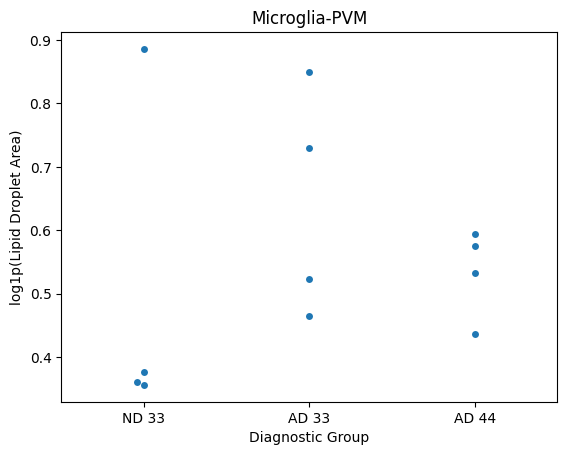

/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


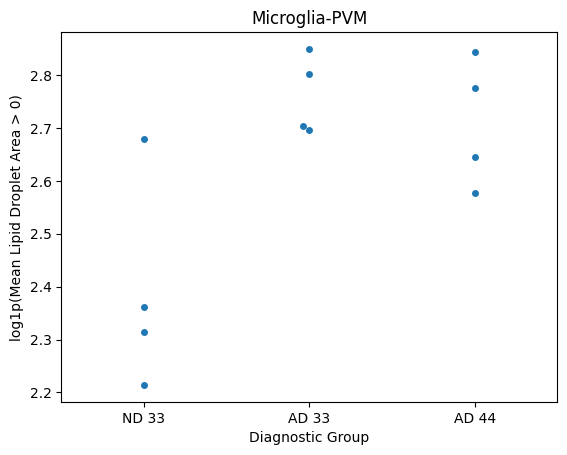

/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


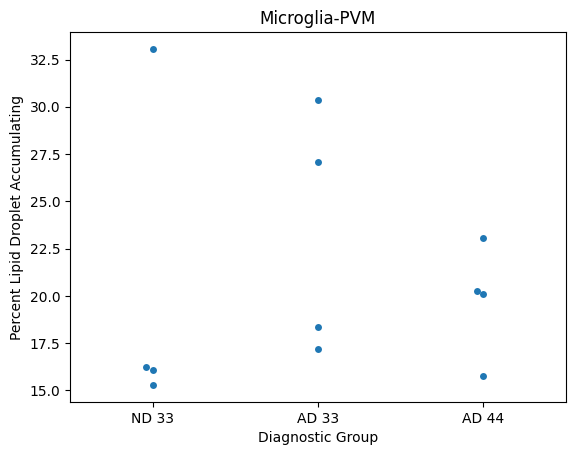

In [73]:
cell_type = "Microglia-PVM"
pathology_measure = "lipid_droplet"
generate_plots(adata, cell_type, column_to_plot = f"log_{pathology_measure}_area_mean").set(title = cell_type, ylabel="log1p(Lipid Droplet Area)", xlabel="Diagnostic Group")
plt.show()
generate_plots(adata, cell_type, column_to_plot = f"log_{pathology_measure}_area_mean_above_zero").set(title = cell_type, ylabel="log1p(Mean Lipid Droplet Area > 0)", xlabel="Diagnostic Group")
plt.show()
generate_plots(adata, cell_type, column_to_plot = f"log_{pathology_measure}_area_percent_above_zero").set(title = cell_type, ylabel="Percent Lipid Droplet Accumulating", xlabel="Diagnostic Group")
plt.show()

/tmp/ipykernel_17510/2803639892.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  table = adata.obs.query("cell_type == @cell_type").groupby("folder-group").agg({
/tmp/ipykernel_17510/3012000548.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  table = adata.obs.query("cell_type == @cell_type").groupby("folder-group").agg({


<Axes: xlabel='log_plin2_area_mean_above_zero', ylabel='log_oil_red_o_area_mean_above_zero'>

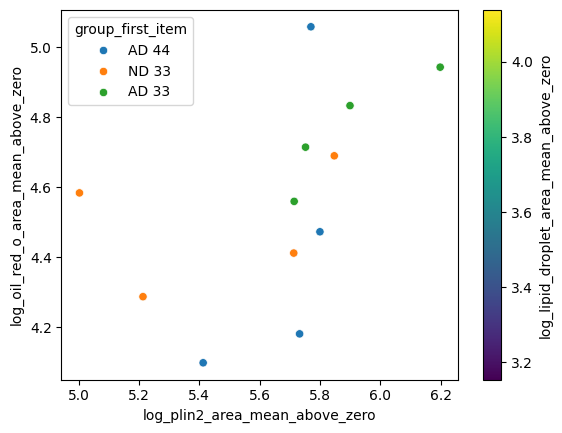

In [107]:
generate_summary_table(adata, cell_type).plot.scatter(x="log_plin2_area_mean_above_zero", y="log_oil_red_o_area_mean_above_zero", c="log_lipid_droplet_area_mean_above_zero")
sns.scatterplot(generate_summary_table(adata, cell_type), x="log_plin2_area_mean_above_zero", y="log_oil_red_o_area_mean_above_zero", hue="group_first_item")

In [75]:
import scipy.stats
pathology_measure = "lipid_droplet"

for cell_type in adata.obs["cell_type"].unique():
    stats = scipy.stats.ttest_ind(
        generate_summary_table(adata, cell_type)[["group_first_item", f"log_{pathology_measure}_area_mean"]] \
            .query("group_first_item == 'AD 33'")[f"log_{pathology_measure}_area_mean"].tolist(), 
        generate_summary_table(adata, cell_type)[["group_first_item", f"log_{pathology_measure}_area_mean"]] \
            .query("group_first_item == 'AD 44'")[f"log_{pathology_measure}_area_mean"].tolist()
    )
    print(cell_type, stats.pvalue)

/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Pvalb 0.4659466025503193


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Astrocyte 0.2723855499315529


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Microglia-PVM 0.3080485347074375
L4 IT 0.03939818162070212


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Oligodendrocyte 0.5990416834570697
Endothelial 0.2963732310148694


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys 

Macrophage 0.19774364405929248
VIP 0.13314850154486513


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys 

L6b 0.13951437688183346
OPC 0.2466332871351012


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


VLMC 0.4189530379155633
L2/3 IT 0.35833192530851743


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]
/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


Sst 0.039465650491010036


/tmp/ipykernel_17510/2803639892.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return x[0]


/tmp/ipykernel_17510/3807380293.py:9: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
/tmp/ipykernel_17510/3807380293.py:13: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
/tmp/ipykernel_17510/3807380293.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, 'OPC'),
  Text(1, 0, 'Macrophage'),
  Text(2, 0, 'Microglia-PVM'),
  Text(3, 0, 'Endothelial'),
  Text(4, 0, 'VIP'),
  Text(5, 0, 'Oligodendrocyte'),
  Text(6, 0, 'Sst'),
  Text(7, 0, 'VLMC'),
  Text(8, 0, 'Pvalb'),
  Text(9, 0, 'Astrocyte'),
  Text(10, 0, 'L2/3 IT'),
  Text(11, 0, 'L4 IT'),
  Text(12, 0, 'L6b')])

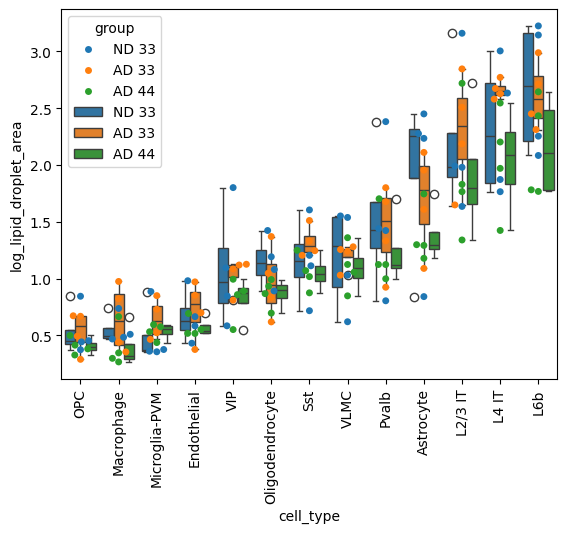

In [110]:
adata.obs["lipid_droplet"] = adata.obs["log_lipid_droplet_area"].gt(0)
adata.obs["plin2"] = adata.obs["log_plin2_area"].gt(0)
adata.obs["oil_red_o"] = adata.obs["log_oil_red_o_area"].gt(0)

pathology_measure = "lipid_droplet"

f, ax = plt.subplots()
sns.swarmplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"],
    ax = ax
)

sns.boxplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"], 
    ax = ax
)

plt.xticks(rotation=90)

/tmp/ipykernel_17510/1331927935.py:9: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
/tmp/ipykernel_17510/1331927935.py:13: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
/tmp/ipykernel_17510/1331927935.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, 'OPC'),
  Text(1, 0, 'Endothelial'),
  Text(2, 0, 'Microglia-PVM'),
  Text(3, 0, 'Macrophage'),
  Text(4, 0, 'VLMC'),
  Text(5, 0, 'VIP'),
  Text(6, 0, 'Oligodendrocyte'),
  Text(7, 0, 'Sst'),
  Text(8, 0, 'Astrocyte'),
  Text(9, 0, 'L2/3 IT'),
  Text(10, 0, 'Pvalb'),
  Text(11, 0, 'L4 IT'),
  Text(12, 0, 'L6b')])

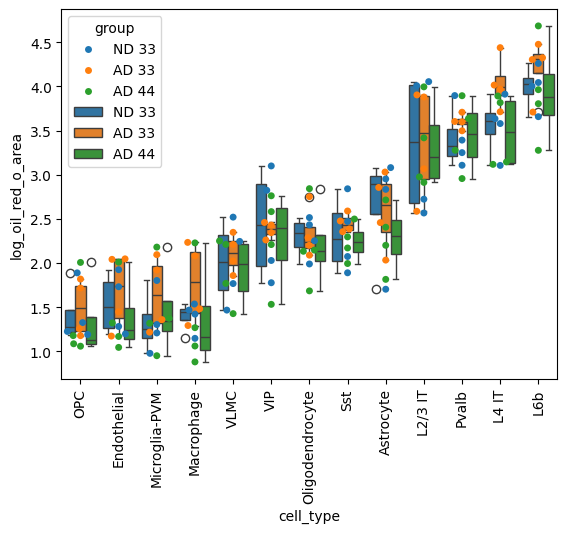

In [79]:
adata.obs["lipid_droplet"] = adata.obs["log_lipid_droplet_area"].gt(0)
adata.obs["plin2"] = adata.obs["log_plin2_area"].gt(0)
adata.obs["oil_red_o"] = adata.obs["log_oil_red_o_area"].gt(0)

pathology_measure = "oil_red_o"

f, ax = plt.subplots()
sns.swarmplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"],
    ax = ax
)

sns.boxplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"], 
    ax = ax
)

plt.xticks(rotation=90)

/tmp/ipykernel_17510/795270074.py:9: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
/tmp/ipykernel_17510/795270074.py:13: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
/tmp/ipykernel_17510/795270074.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to 

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, 'OPC'),
  Text(1, 0, 'Microglia-PVM'),
  Text(2, 0, 'Endothelial'),
  Text(3, 0, 'Macrophage'),
  Text(4, 0, 'VLMC'),
  Text(5, 0, 'Oligodendrocyte'),
  Text(6, 0, 'Sst'),
  Text(7, 0, 'VIP'),
  Text(8, 0, 'Astrocyte'),
  Text(9, 0, 'Pvalb'),
  Text(10, 0, 'L2/3 IT'),
  Text(11, 0, 'L4 IT'),
  Text(12, 0, 'L6b')])

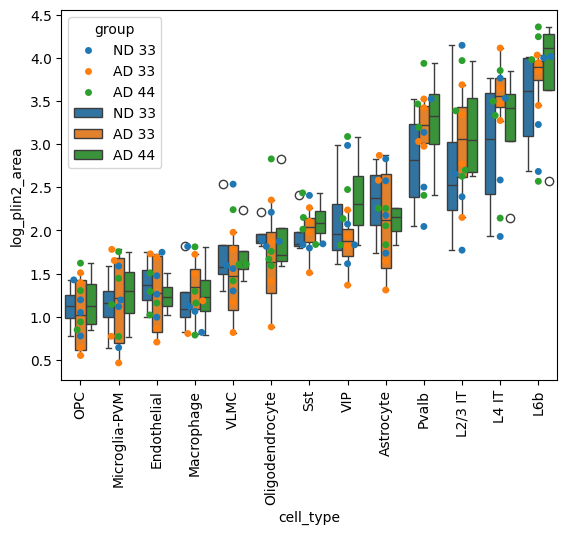

In [109]:
adata.obs["lipid_droplet"] = adata.obs["log_lipid_droplet_area"].gt(0)
adata.obs["plin2"] = adata.obs["log_plin2_area"].gt(0)
adata.obs["oil_red_o"] = adata.obs["log_oil_red_o_area"].gt(0)

pathology_measure = "plin2"

f, ax = plt.subplots()
sns.swarmplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"],
    ax = ax
)

sns.boxplot(
    adata.obs.pivot_table(index=["group", "folder", "cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").reset_index(),
    x="cell_type", 
    y=f"log_{pathology_measure}_area",
    hue="group",
    order = adata.obs.pivot_table(index=["cell_type"], values = [f"log_{pathology_measure}_area"], aggfunc="mean").sort_values(by=f"log_{pathology_measure}_area").index.tolist(),
    hue_order = ["ND 33", "AD 33", "AD 44"], 
    ax = ax
)

plt.xticks(rotation=90)

In [81]:
results = {}
for folder in adata.obs.folder.unique():
    results[folder] = adata.obs.query("folder == @folder and cell_type == 'Astrocyte'")["oil_red_o"].sample(10_000, replace=True).sum()

<Axes: xlabel='index', ylabel='0'>

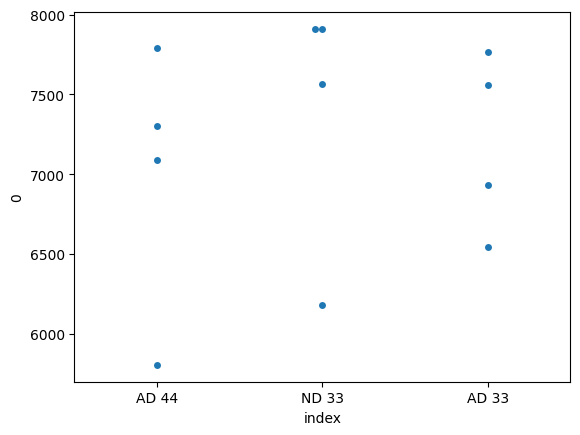

In [82]:
import pandas as pd

sns.swarmplot(
    pd.Series(results).reset_index().replace(adata.obs[["folder", "group"]].drop_duplicates().set_index("folder")["group"].to_dict()),
    x="index",
    y=0
)



In [83]:
results = {}
for folder, df in adata.obs.query("spatial_niche == '1' and cell_type == 'L4 IT'").groupby("folder"):
    try: 
        results[folder] = df["oil_red_o_area"].sample(1_000, replace=True).sum()
    except:
        pass
    

sns.swarmplot(
    pd.Series(results).reset_index().replace(adata.obs[["folder", "group"]].drop_duplicates().set_index("folder")["group"].to_dict()),
    x="index",
    y=0,
    order=["ND 33", "AD 33", "AD 44"]
)

UndefinedVariableError: name 'spatial_niche' is not defined

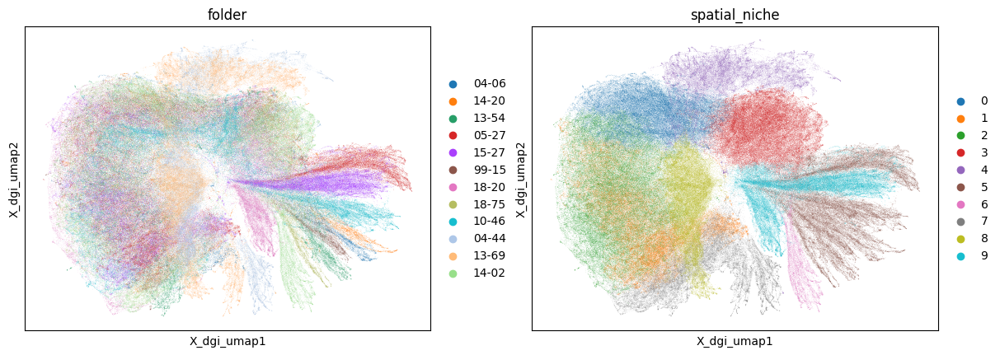

In [176]:
sc.pl.embedding(adata, basis="X_dgi_umap", color=["folder", "spatial_niche"], cmap="tab20")